## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## Compute the camera calibration using chessboard images

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
!ls

Advanced Lane Finding Project.ipynb  harder_challenge_video.mp4
camera_cal			     output_images
camera_cal_results		     project_video.mp4
challenge_video.mp4		     README.md
examples			     test_images
example_writeup.pdf		     writeup_template.md


In [6]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2) # x, y co-ordinates index
# print(objp)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/cal*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        write_name = './camera_cal_results/corners_found'+str(idx)+'.jpg'
        cv2.imwrite(write_name, img)

Here I only show one of the output result image. 

![alt text](camera_cal_results/corners_found0.jpg)

Here I broke the pipeline into several functions. They are:
* getObjImgPoings(): the function I wrapped above procedure in a function, it will return the objpoints and imgpoints
* cameraCalibration(): 

In [7]:
def getObjImgPoints(imgsDir, nx, ny):
    '''
    getObjImgPoings(): the function I wrapped above procedure in a function, it will return the objpoints and imgpoints
        Input: 
            * imgsDir: the directory where the images are located
            * nx: how many points on row
            * ny: how many points on column
        Output:
            * objpoints: list of list of 3d points in real world space
            * imgpoints: list of list of 2d points in image plane
    '''
    import os
    import numpy as np
    import cv2
    import glob
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2) # x, y co-ordinates index
    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.
    
    # Make a list of calibration images
    images = glob.glob(os.path.join(imgsDir, '*.jpg'))
    for idx, fname in enumerate(images):
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
    return objpoints, imgpoints

def cameraCalibration(img, calImgDir, nx, ny):
    import os
    import numpy as np
    import cv2
    import glob
    '''
    cameraCalibration(): the function use the objpoints and imgpoints from the getObjImgPoints() output to return parameters to undistort an image.
        Input: 
            * img: image used to find the image dimension
            * imgsDir: the directory where the images are located.
            * objpoints: list of list of 3d points in real world space.
            * imgpoints: list of list of 2d points in image plane.
        Output:
            * calibrationResults: dictionary contain mtx and dist (cameraMatrix and distCoeffs). 
    '''
    img_size = (img.shape[1], img.shape[0])
    # Use getObjImgPoints() function to get object and image points.
    objpoints, imgpoints = getObjImgPoints(calImgDir, nx, ny)
    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None,None)
    calibrationResults = {"mtx": mtx, "dist": dist}
    return calibrationResults

def undistort(img, calImgDir, nx, ny):
    import os
    import numpy as np
    import cv2
    import glob
    '''
    undistort(): the function use the output from the cameraCalibration() to undistort an image.
        Input: 
            * img: image needs to be undistort
            * calImgDir: the directory where the images are located.
            * nx: how many points on row
            * ny: how many points on column
        Output:
            * dst: undistort image. 
    '''
    calibrationResults = cameraCalibration(img, calImgDir, nx, ny)
    mtx = calibrationResults['mtx']
    dist = calibrationResults['dist']
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    return dst

Show the results of the functions to undistort an image

In [10]:
fname = './camera_cal/calibration2.jpg'
img = cv2.imread(fname)
camera_cal = './camera_cal'
dst = undistort(img, camera_cal, 9, 6)

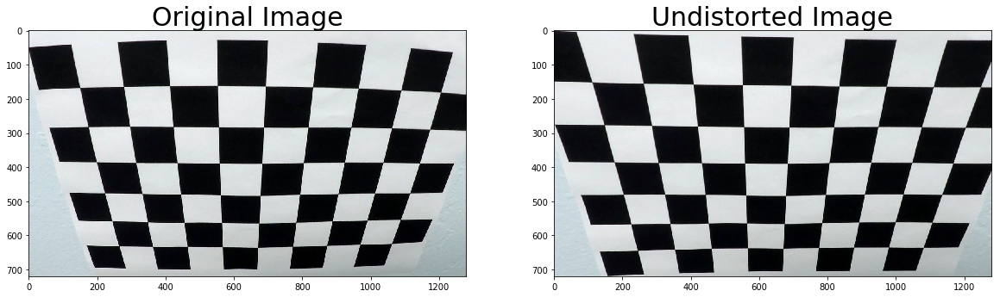

In [14]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

Save the  calibration result for later use

In [12]:
fname = './camera_cal/calibration2.jpg'
img = cv2.imread(fname)
camera_cal = './camera_cal'
dist_pickle = cameraCalibration(img, camera_cal, 9, 6)
import pickle
pickle.dump(dist_pickle, open('./calibrate.p', 'wb'))

## Pipline for Test Images

In [2]:
# Helper functions

import pickle
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

# Load calibration
def load_calibration():
    dist_pickle = pickle.load(open('./calibrate.p', "rb"))
    return dist_pickle['mtx'], dist_pickle['dist']

# Plot figures
def plot_figures(figures, nrows = 1, ncols=1, labels=None, show_axis=False):
    fig, axs = plt.subplots(ncols=ncols, nrows=nrows, figsize=(12, 10))
    axs = axs.ravel()
    for index, title in zip(range(len(figures)), figures):
        axs[index].imshow(figures[title], plt.gray())
        if(labels != None):
            axs[index].set_title(labels[index])
        else:
            axs[index].set_title(title)

        axs[index].set_axis_off()

    plt.tight_layout()

Following functions are from the Udacity course materials.

In [3]:
# Define a function that applies Sobel x or y
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, abs_thresh=(0, 255)):
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # 3) Take the absolute value of the derivative or gradient
    abs_sobelx = np.absolute(abs_sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    # 5) Create a mask of 1's where the scaled gradient magnitude
            # is > thresh_min and < thresh_max
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= abs_thresh[0]) & (scaled_sobel <= abs_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return sxbinary

In [4]:
# Magnitude of the Gradient function
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradmag)/255
    gradmag = (gradmag/scale_factor).astype(np.uint8)
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

In [5]:
# Define a function that applies Sobel x and y,
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    sobel_absx = np.absolute(sobelx)
    sobel_absy = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient
    sobel_arc = np.arctan2(sobel_absy, sobel_absx)
    # 5) Create a binary mask where direction thresholds are met
    binary_mask = np.zeros_like(sobel_arc)
    # 6) Return this mask as your binary_output image
    binary_mask[(sobel_arc >= thresh[0]) & (sobel_arc <= thresh[1])] = 1
    return binary_mask

In [6]:
# HLS and HSV Color Threshold functions
def hls_select(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    img_hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    img_s_channel = img_hls[:,:,2]
    # 2) Apply a threshold to the S channel
    binary_output = np.zeros_like(img_s_channel)
    binary_output[(img_s_channel > thresh[0]) & (img_s_channel <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    return binary_output

def hsv_select(img,thresh=(0,255)):
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    img_v_channel = img_hsv[:,:,2]
    # Apply a threshold to the V channel
    binary_output = np.zeros_like(img_v_channel)
    binary_output[(img_v_channel > thresh[0]) & (img_v_channel<=thresh[1])] = 1
    return binary_output

In [7]:
# Combine all the threshold functions and apply to image
# Using the default reaults suggested from the udacity.
def combine(image):
    sobel = abs_sobel_thresh(image, orient='x', sobel_kernel=9, abs_thresh=(30,100))
    s_hls = hls_select(image, thresh=(90, 255))
    v_hsv = hsv_select(image, thresh=(75,255))
    binary_warped = np.zeros_like(sobel)
    binary_warped[(sobel==1)|(s_hls==1) & (v_hsv ==1)]=1
    return binary_warped

In [8]:
# Measure Curveture function, window_mask function, and find_window_centroids function
def measure_curve(ploty,leftx,lefty,rightx,righty):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    print(left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m
    radius = (left_curverad+right_curverad)/2
    print(radius)
    return radius

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image, window_width, window_height, margin):
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions

    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template
    warped = image
    #plt.imshow(warped)
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
    #print(l_sum)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)

    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))

    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(warped.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids

In [9]:
# Using hsv instead of hls and apply sobel x trhesh, gradient thresh, color thresh
def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1

    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    return color_binary

In [10]:
# Find the best perspective transformation parameter.
src = np.float32(
    [[200, 700],
     [1080, 700],
     [570, 460],
     [710, 460]])

dst = np.float32(
    [[260, 700],
     [1020, 700],
     [240, 0],
     [1040, 0]])

In [11]:
M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)

Need to redefine a undistort function for the pipeline.

In [13]:
def undistort(image, mtx, dist):
    return cv2.undistort(image, mtx, dist, None, mtx)

## Testing above functios on test images for undistortion and perspective transformation

### Testing the perpective function.

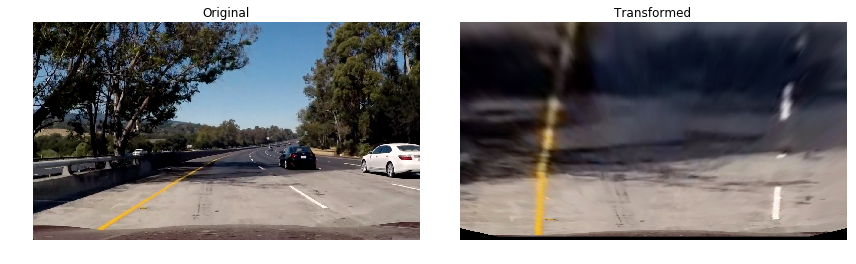

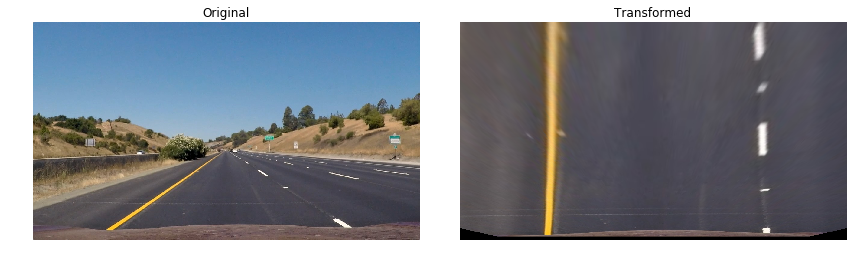

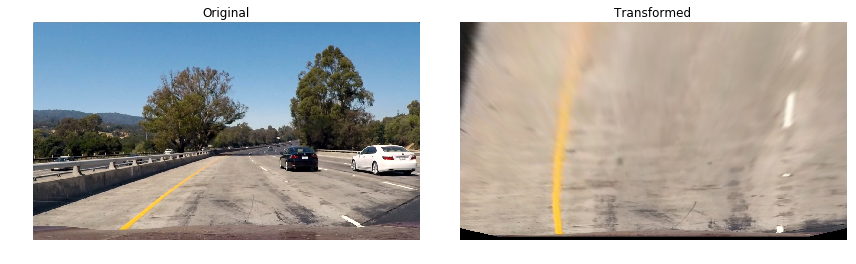

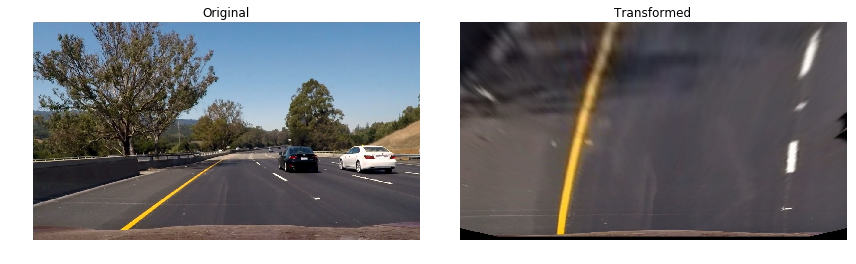

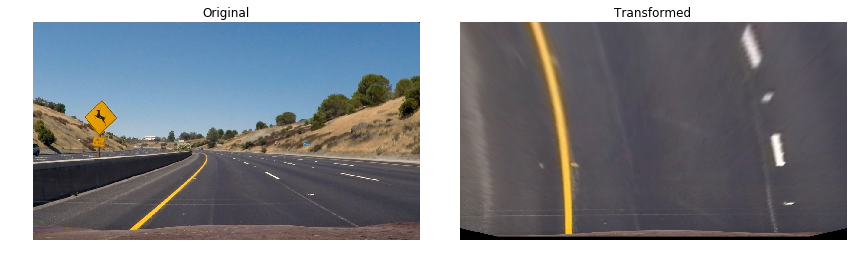

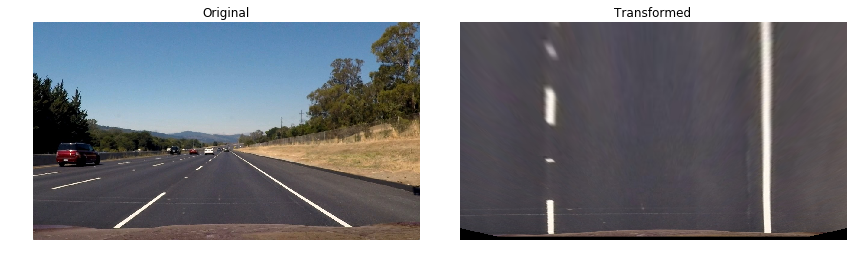

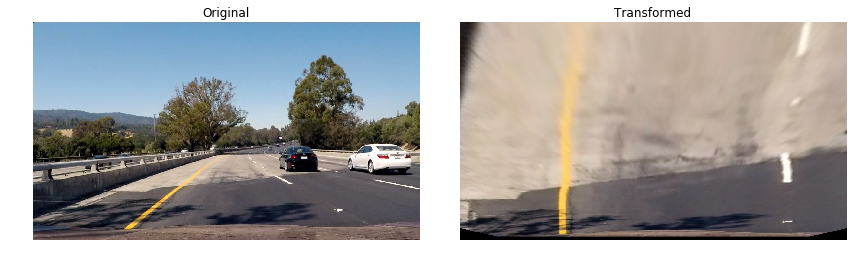

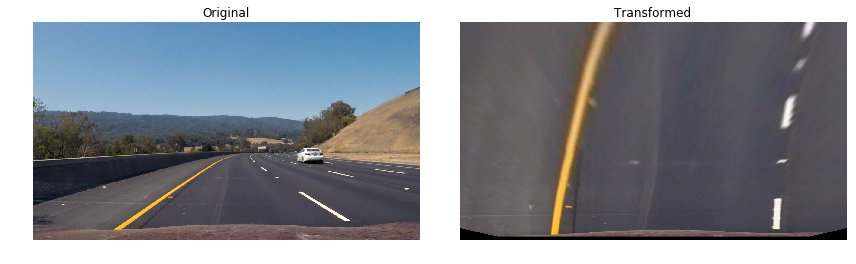

In [16]:
original_figures = {}
undistorted_figures = {}
mtx, dist = load_calibration()
for i, filename in enumerate(glob.glob('./test_images/*.jpg')):
    img = cv2.imread(filename)
    original_figures[i] = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = undistort(img, mtx, dist)

    undistort_name = './output_images/undistorted' + str(i + 1) + '.jpg'
    cv2.imwrite(undistort_name, img)

    img_size = (img.shape[1], img.shape[0])
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    undistorted_figures[i] = cv2.cvtColor(warped, cv2.COLOR_BGR2RGB)

    perspective_name = './output_images/undistorted_perspective_transform' + str(i + 1) + '.jpg'
    cv2.imwrite(perspective_name, undistorted_figures[i])
#     plt.imshow(warped)

print_figures = {}
count = 0
for i in range(len(original_figures)):
    print_figures[count] = original_figures[i]
    print_figures[count+1] = undistorted_figures[i]
    plot_figures(print_figures, 1, 2, labels=["Original", "Transformed"])
    count = 0

### Testing the Sobel threshold funciton, only use x orient, since it very similiar to the y orient.

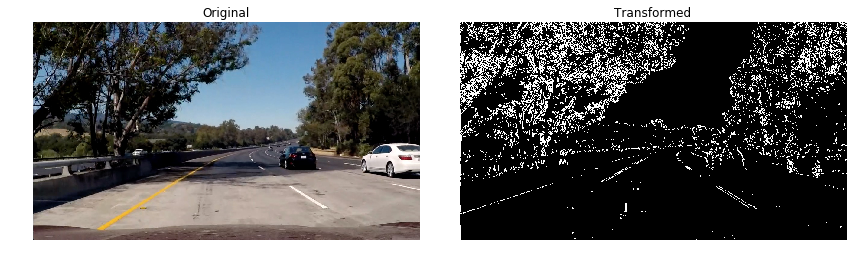

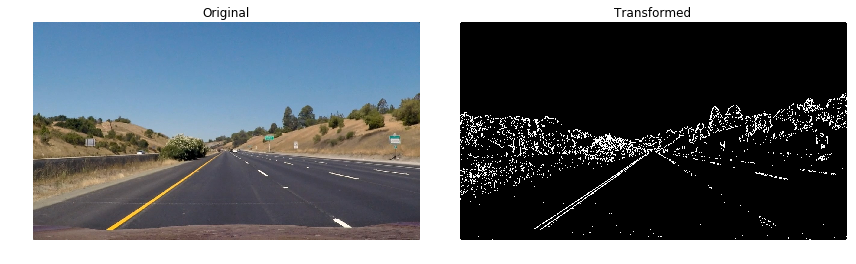

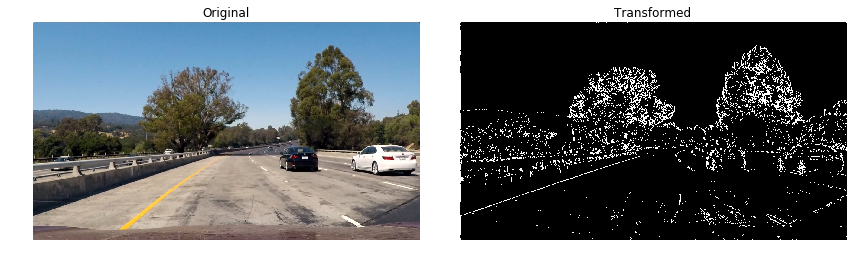

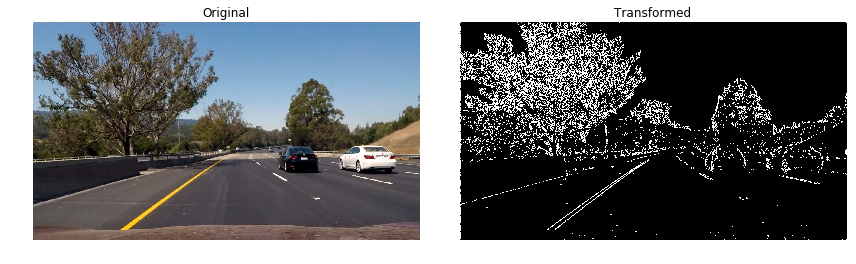

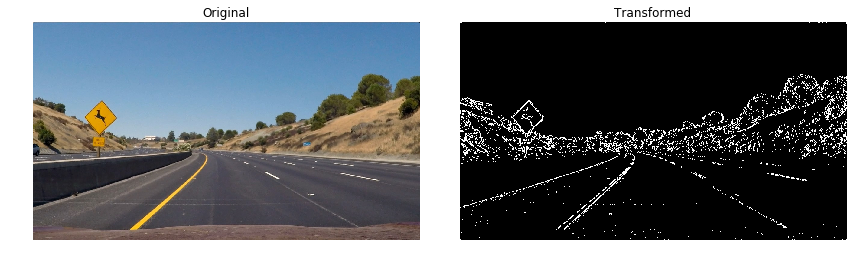

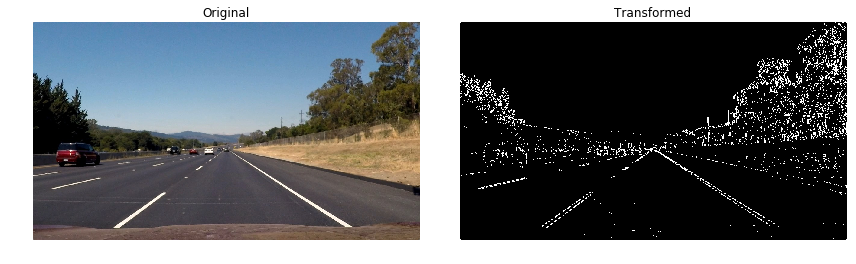

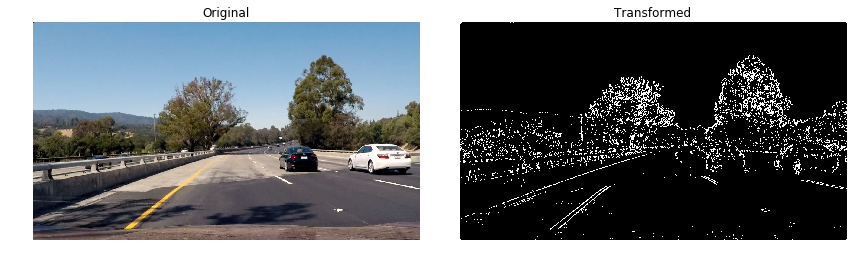

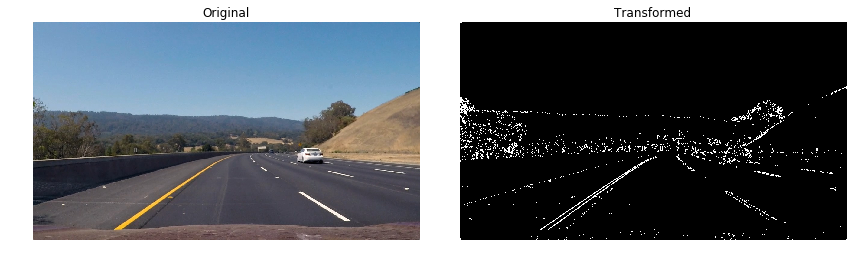

In [17]:
print_figures = {}
count = 0
for i in range(len(original_figures)):
    gradx = abs_sobel_thresh(original_figures[i], orient='x', sobel_kernel=3, abs_thresh=(20, 100))
    print_figures[count] = original_figures[i]
    print_figures[count+1] = gradx
    plot_figures(print_figures, 1, 2, labels=["Original", "Transformed"])
    count = 0

### Testing the Magnitude of the Gradient threshold funciton, only use x orient, since it was suggested by the lesson.

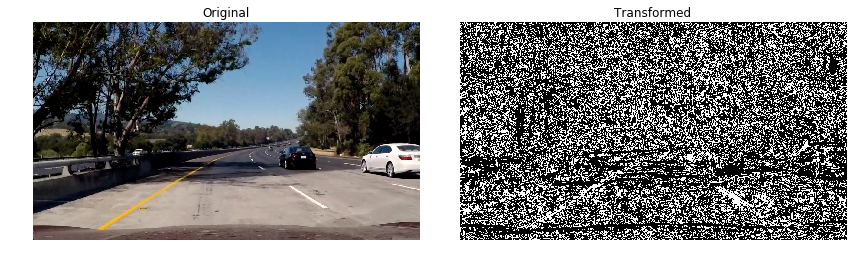

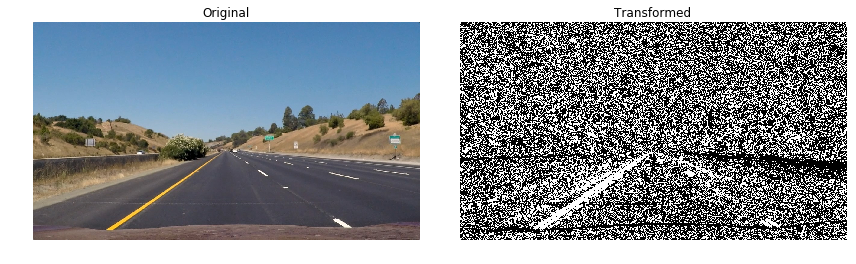

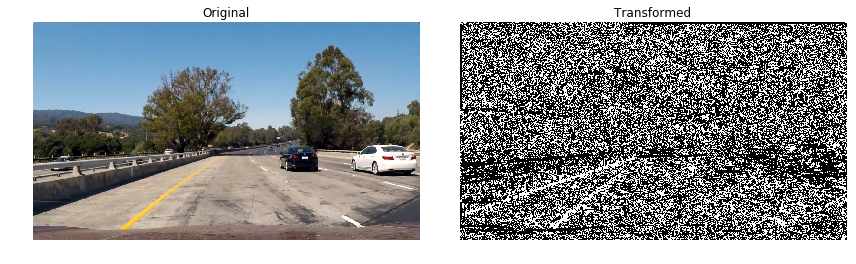

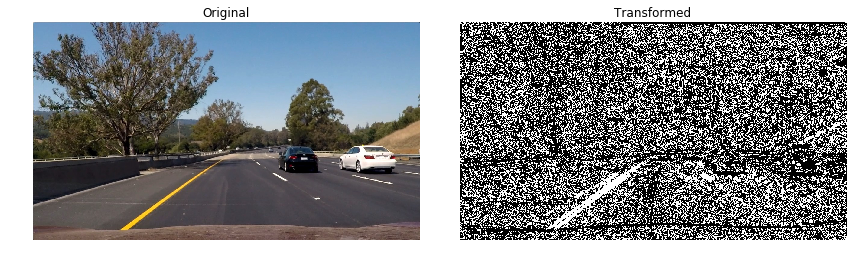

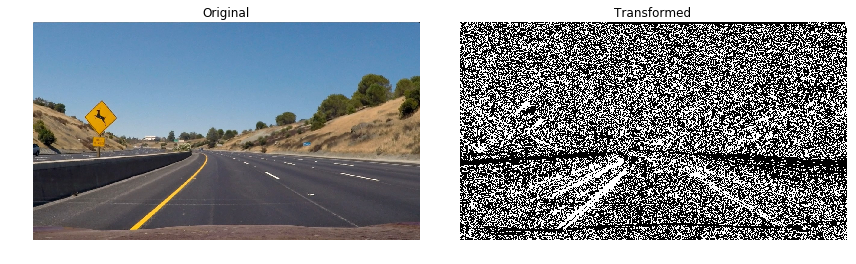

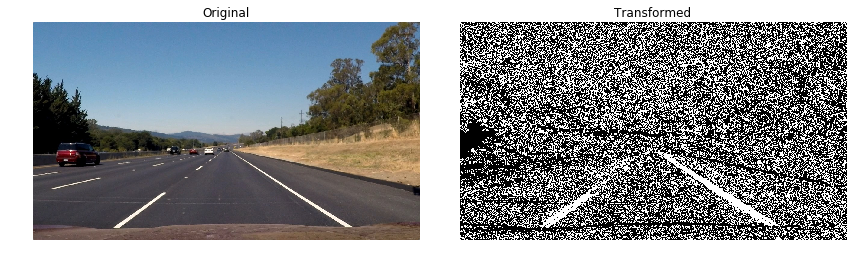

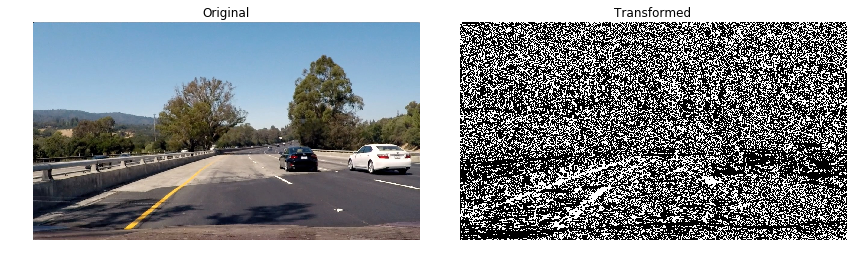

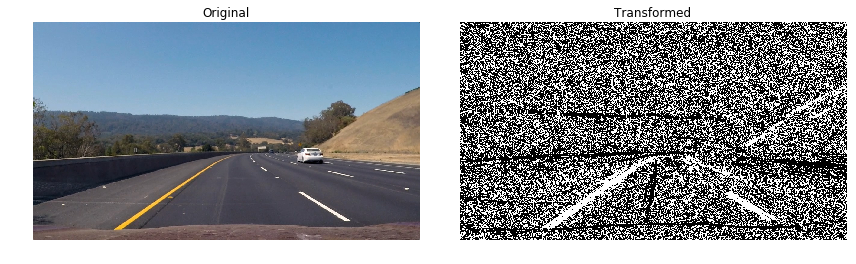

In [18]:
print_figures = {}
count = 0
for i in range(len(original_figures)):
    dir_binary = dir_threshold(original_figures[i], sobel_kernel=15, thresh=(0.7, 1.3))
    print_figures[count] = original_figures[i]
    print_figures[count+1] = dir_binary
    plot_figures(print_figures, 1, 2, labels=["Original", "Transformed"])
    count = 0

### Testing on combining several functions

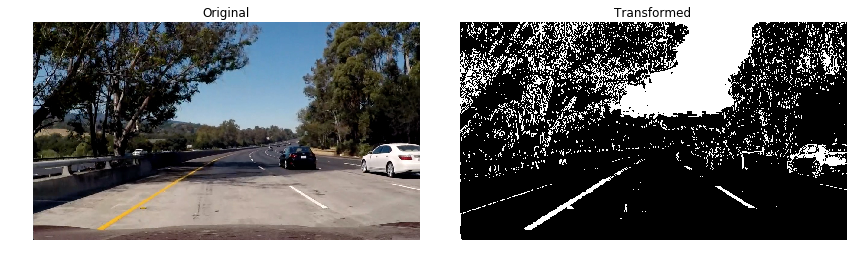

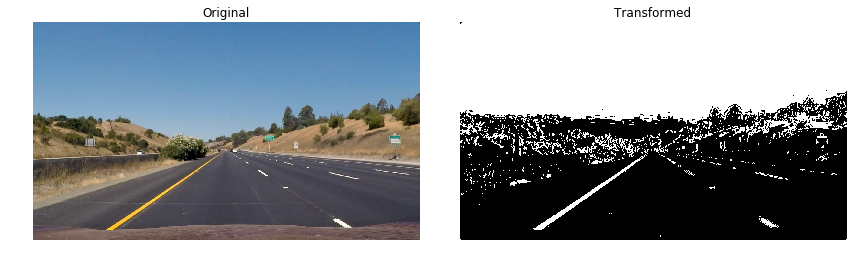

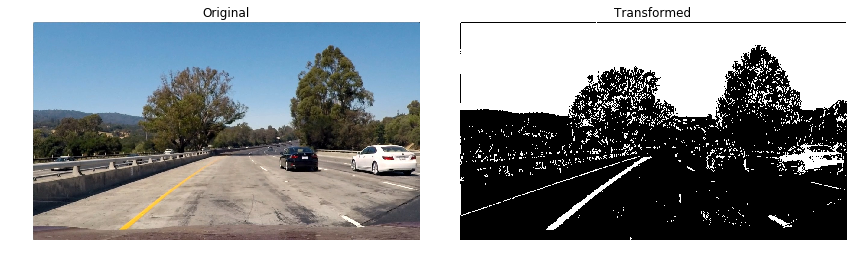

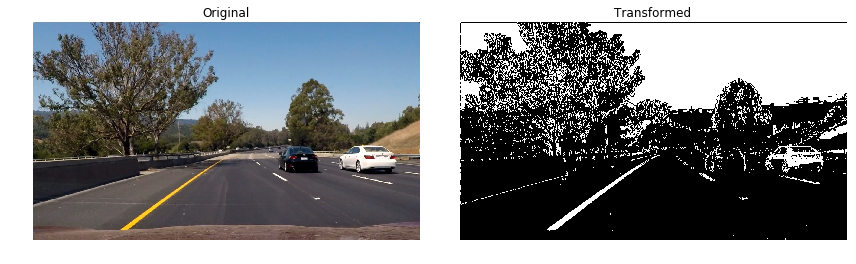

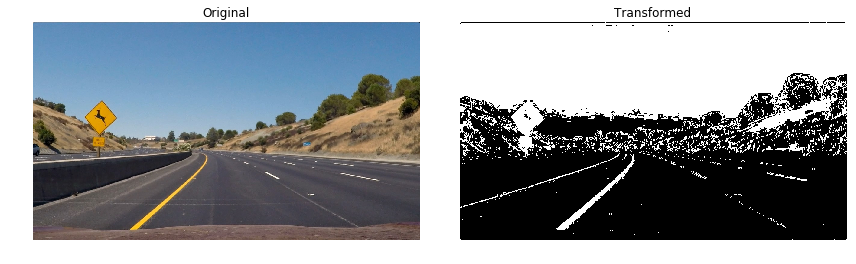

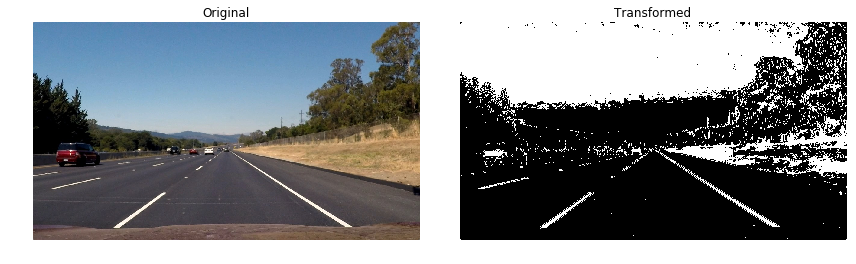

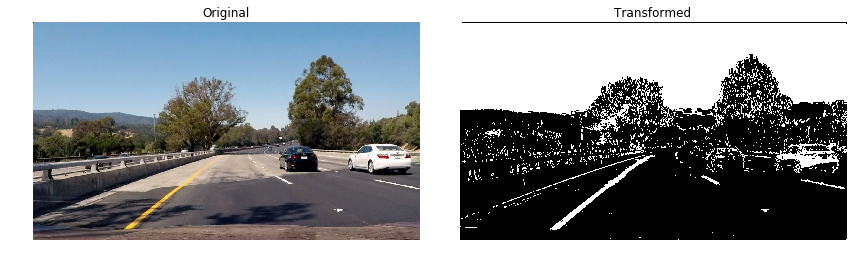

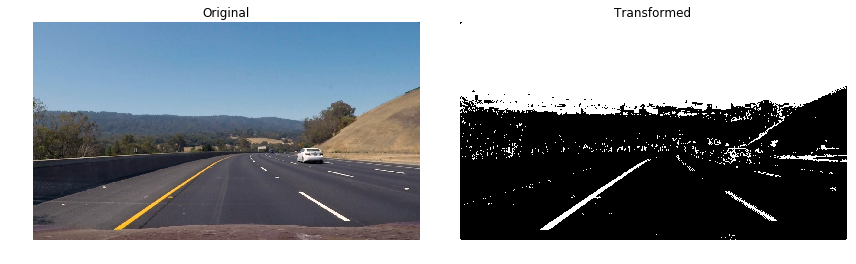

In [19]:
print_figures = {}
count = 0
for i in range(len(original_figures)):
    combined = combine(original_figures[i])
    print_figures[count] = original_figures[i]
    print_figures[count+1] = combined
    plot_figures(print_figures, 1, 2, labels=["Original", "Transformed"])
    count = 0

### Apparently these transformation threshold was not inted to used to the original image but the pespective transformed image.

#### Use the S channel of HLS color scheme

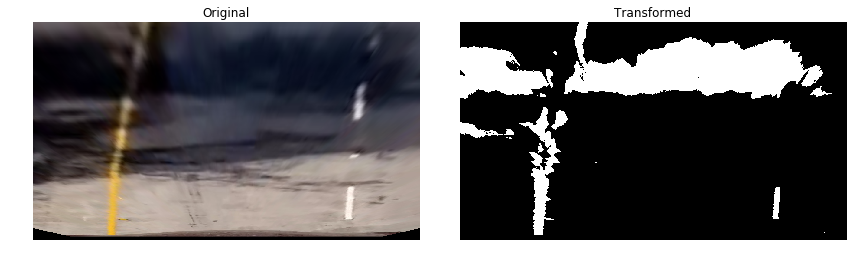

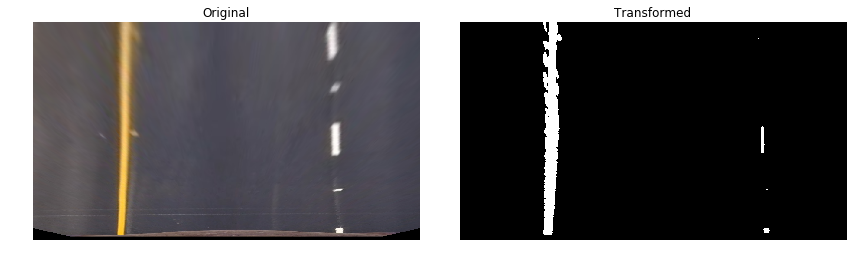

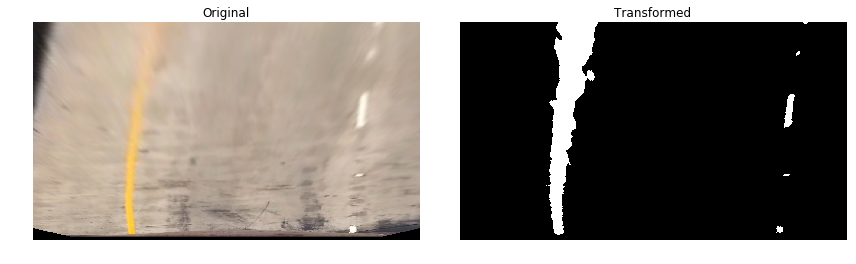

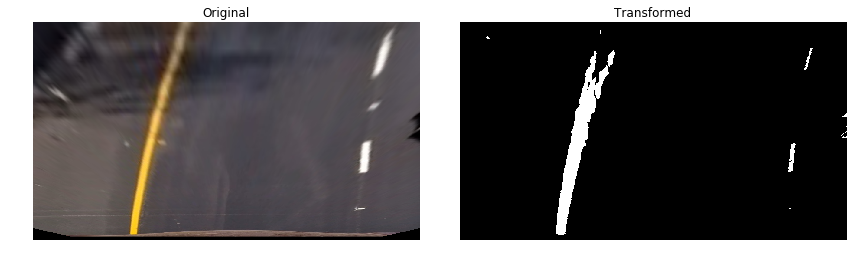

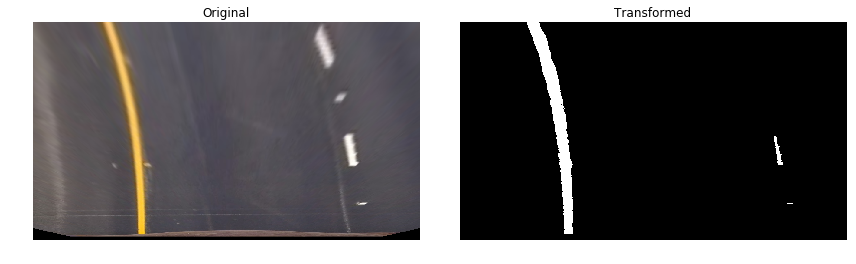

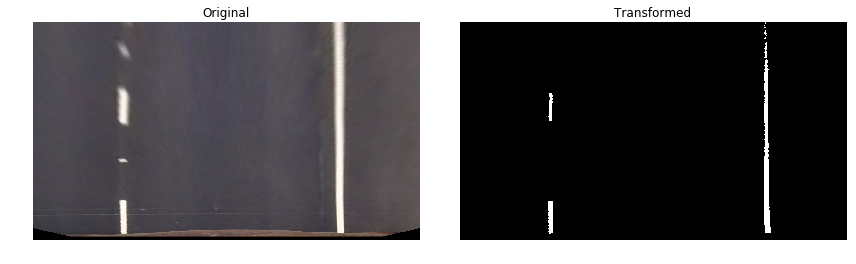

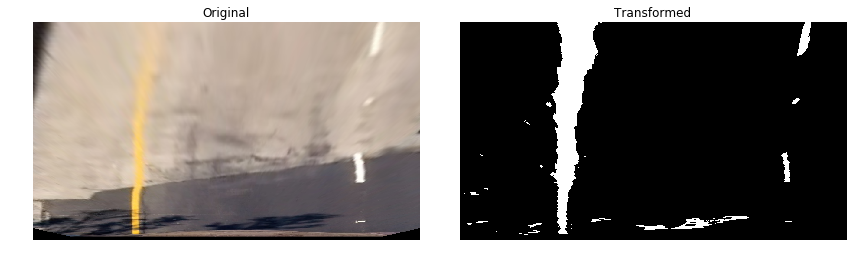

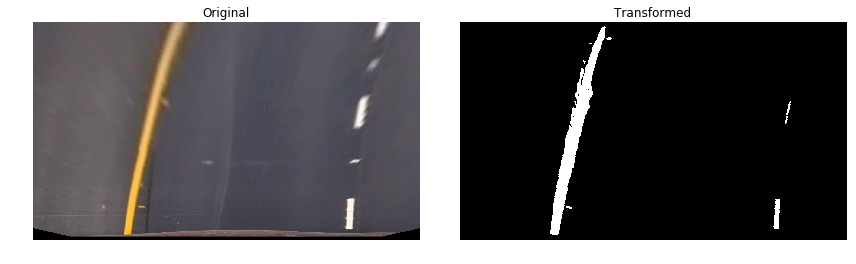

In [21]:
# Need to run the folloing code if from this point
# original_figures = {}
# undistorted_figures = {}
# mtx, dist = load_calibration()
# for i, filename in enumerate(glob.glob('./test_images/*.jpg')):
#     img = cv2.imread(filename)
#     original_figures[i] = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#     img = undistort(img, mtx, dist)

#     undistort_name = './output_images/undistorted' + str(i + 1) + '.jpg'
#     cv2.imwrite(undistort_name, img)

#     img_size = (img.shape[1], img.shape[0])
#     warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
#     undistorted_figures[i] = cv2.cvtColor(warped, cv2.COLOR_BGR2RGB)

#     perspective_name = './output_images/undistorted_perspective_transform' + str(i + 1) + '.jpg'
#     cv2.imwrite(perspective_name, undistorted_figures[i])
#########################################################

print_figures = {}
count = 0
for i in range(len(undistorted_figures)):
    hls = cv2.cvtColor(undistorted_figures[i], cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]

    thresh = (90, 255)
    binary = np.zeros_like(S)
    binary[(S > thresh[0]) & (S <= thresh[1])] = 1

    print_figures[count] = undistorted_figures[i]
    print_figures[count+1] = binary
    plot_figures(print_figures, 1, 2, labels=["Original", "Transformed"])
    count = 0

#### Using the H channel of the HLS

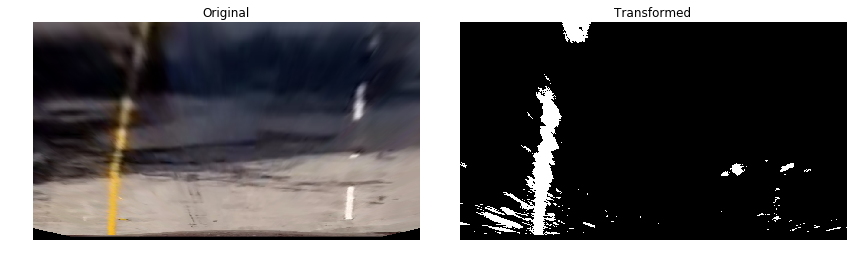

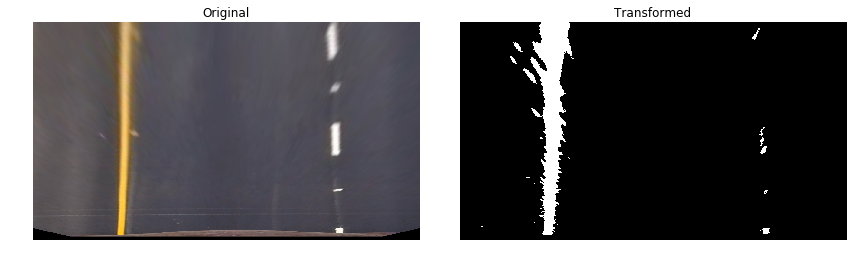

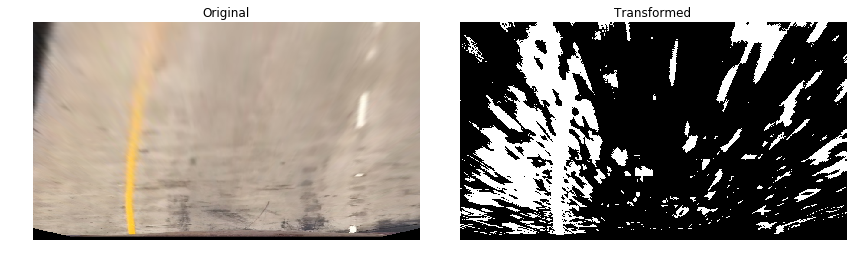

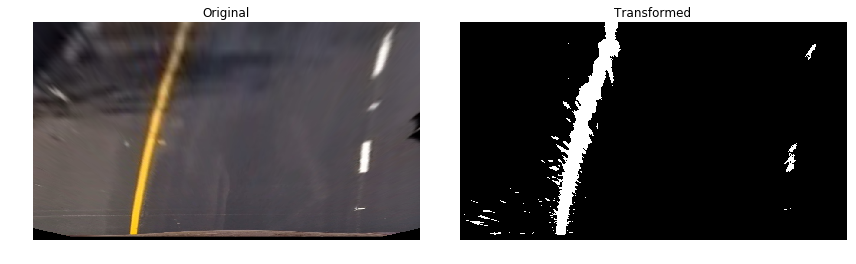

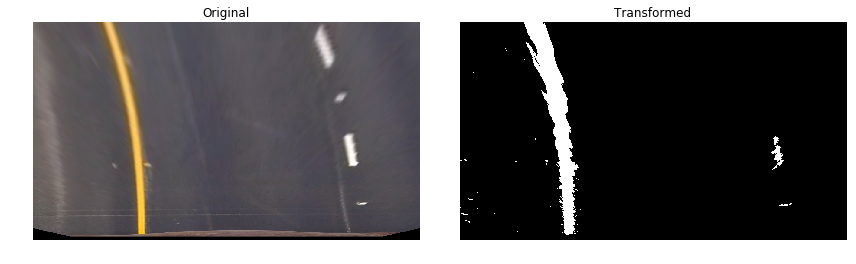

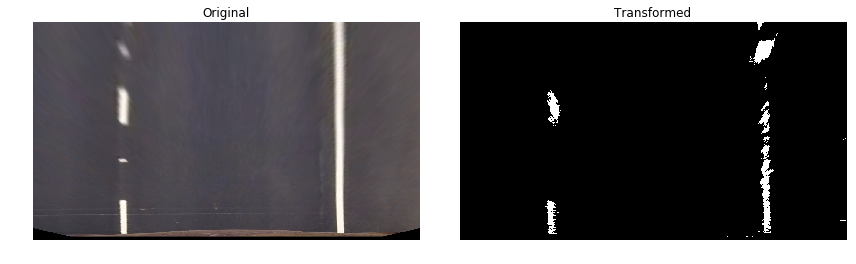

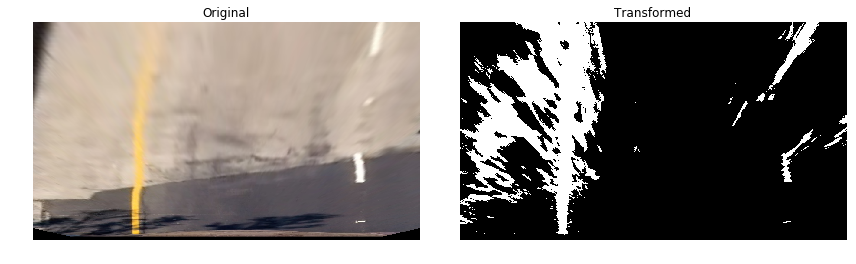

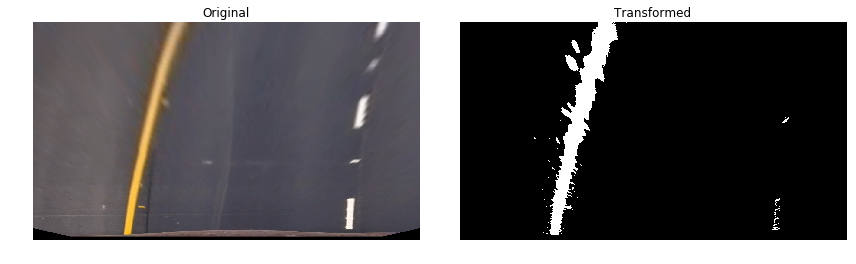

In [23]:
print_figures = {}
count = 0
for i in range(len(undistorted_figures)):
    hls = cv2.cvtColor(undistorted_figures[i], cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]

    thresh = (15, 100)
    binary = np.zeros_like(H)
    binary[(H > thresh[0]) & (H <= thresh[1])] = 1

    print_figures[count] = undistorted_figures[i]
    print_figures[count+1] = binary
    plot_figures(print_figures, 1, 2, labels=["Original", "Transformed"])
    count = 0

#### Using the L channel of the HLS color scheme

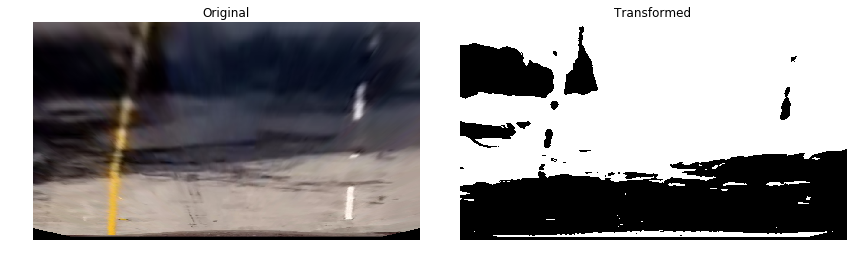

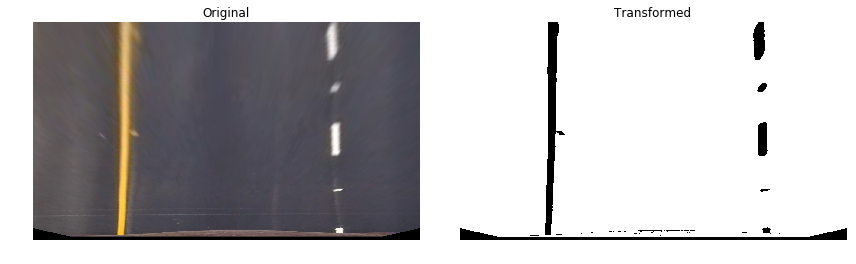

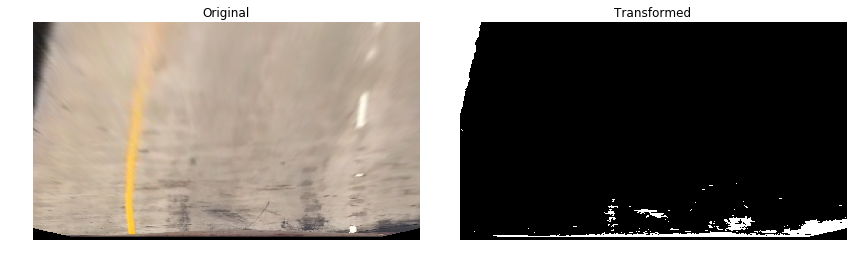

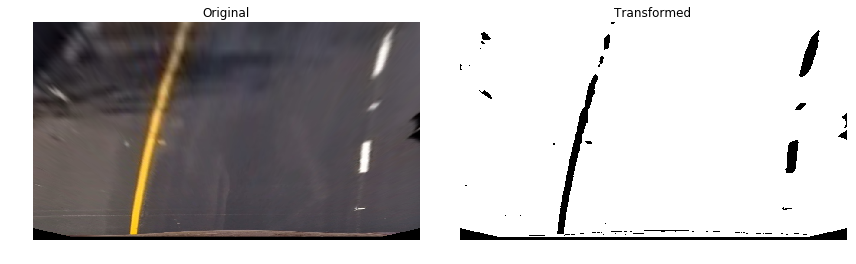

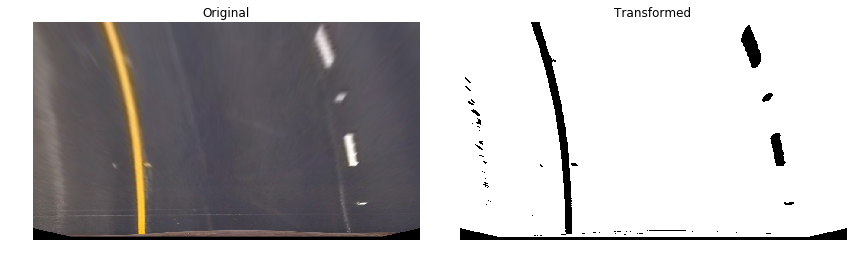

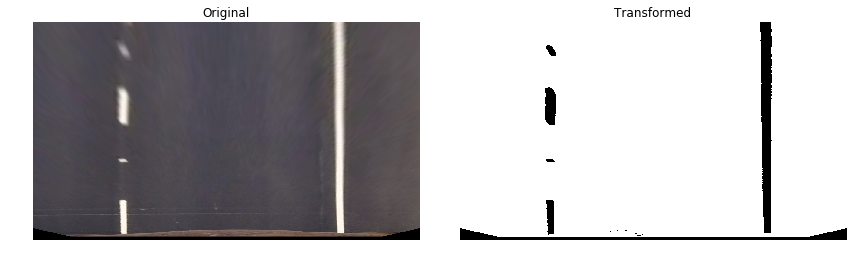

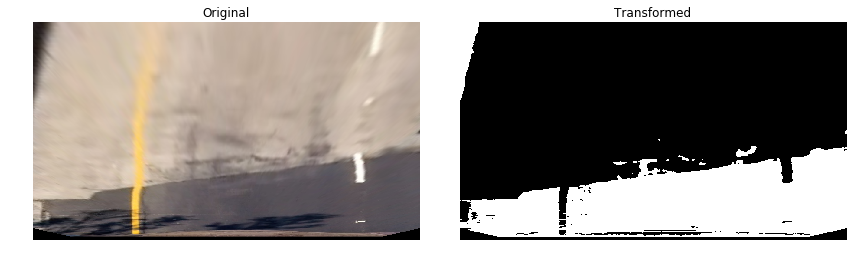

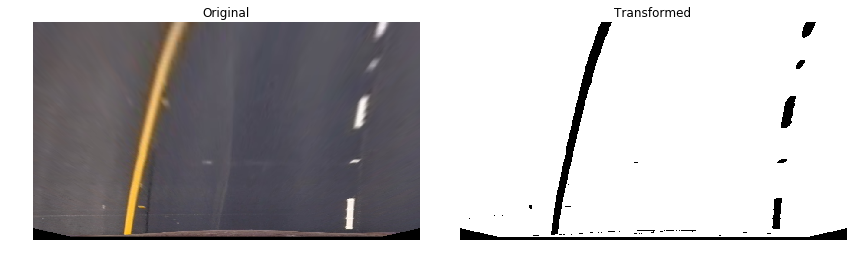

In [24]:
print_figures = {}
count = 0
for i in range(len(undistorted_figures)):
    hls = cv2.cvtColor(undistorted_figures[i], cv2.COLOR_RGB2HLS)
    L = hls[:,:,1]

    thresh = (15, 125)
    binary = np.zeros_like(L)
    binary[(L > thresh[0]) & (L <= thresh[1])] = 1

    print_figures[count] = undistorted_figures[i]
    print_figures[count+1] = binary
    plot_figures(print_figures, 1, 2, labels=["Original", "Transformed"])
    count = 0

#### Testing on using combine function, which include abs sobel, S channel from HLS and V channel from HSV thresholds.

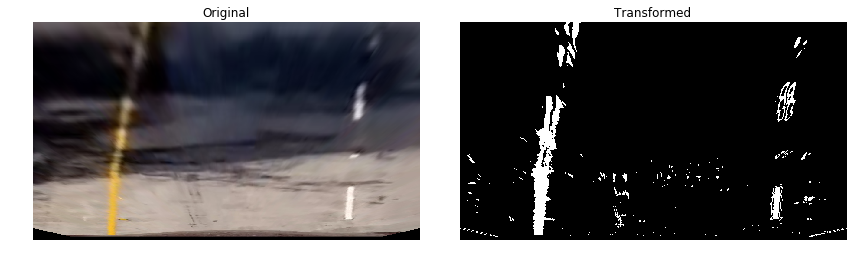

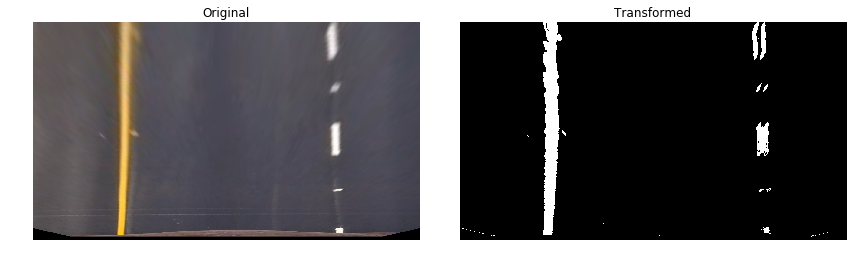

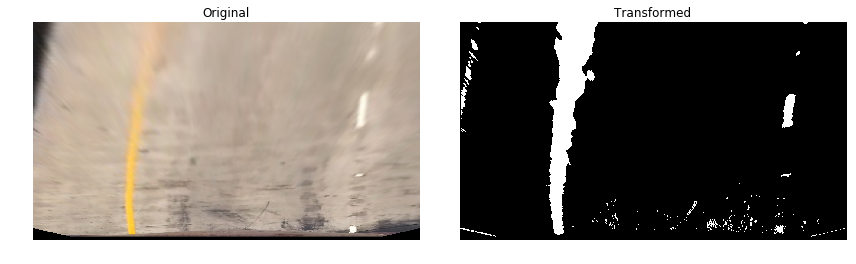

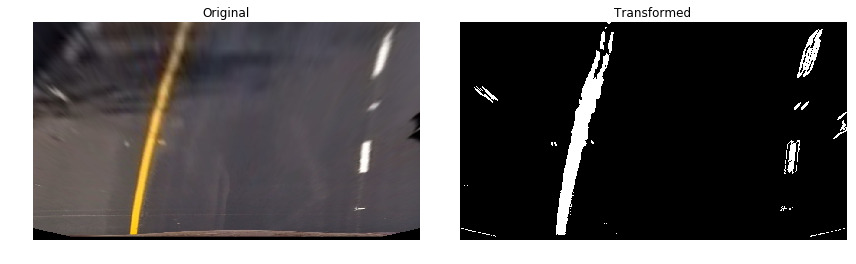

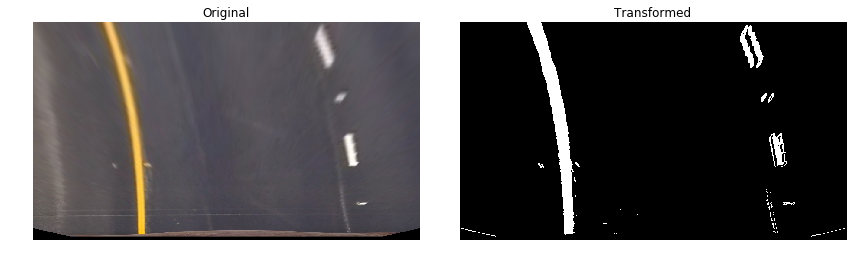

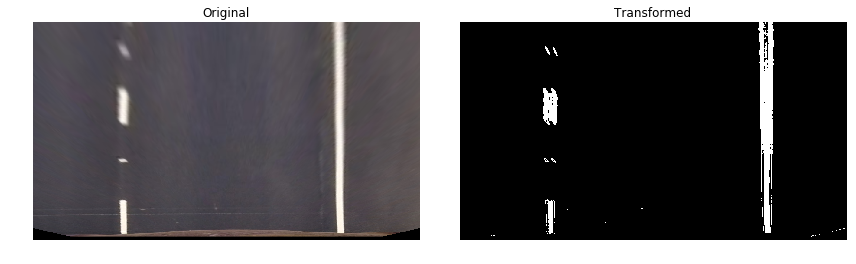

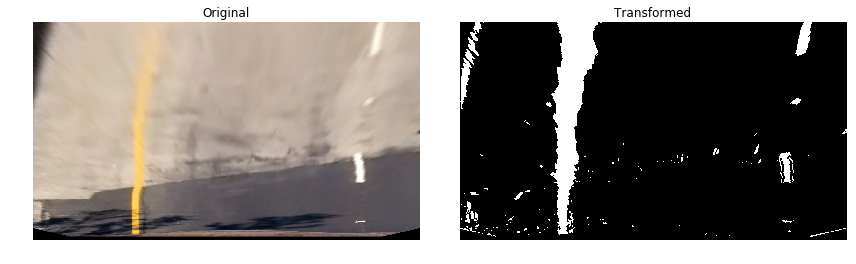

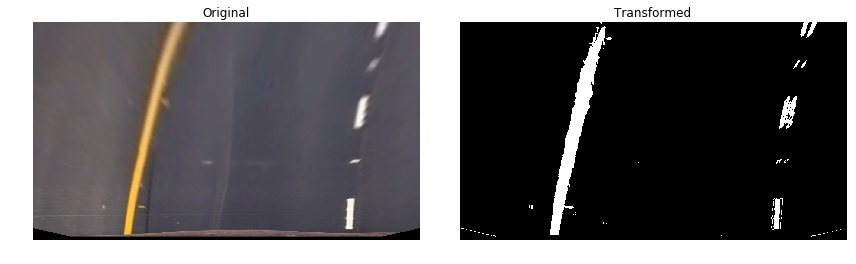

In [25]:
print_figures = {}
count = 0
for i in range(len(undistorted_figures)):
    combined = combine(undistorted_figures[i])
    combined_name = './output_images/combined_binary' + str(i + 1) + '.jpg'
    cv2.imwrite(combined_name, combined)

    print_figures[count] = undistorted_figures[i]
    print_figures[count+1] = combined
    plot_figures(print_figures, 1, 2, labels=["Original", "Transformed"])
    count = 0

#### Testing on the pipeline function, which include L and S channel from the HSV, abs sobels and gradient. 

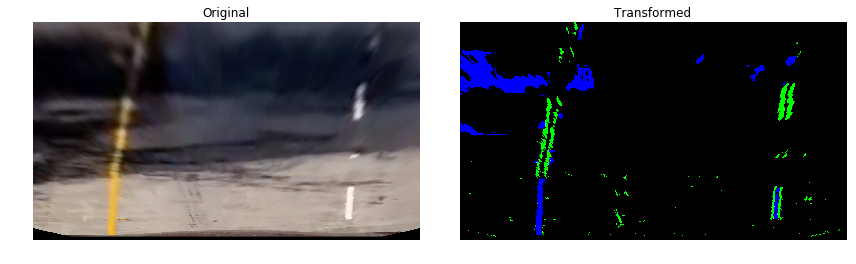

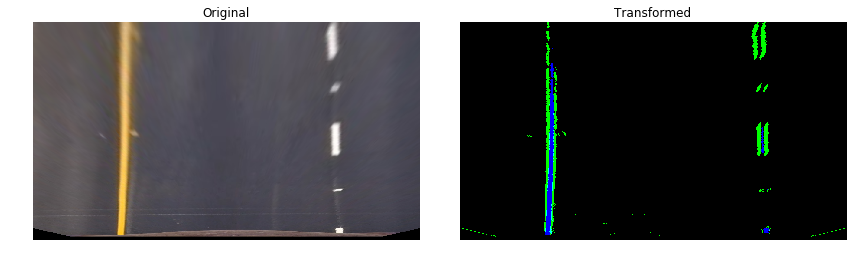

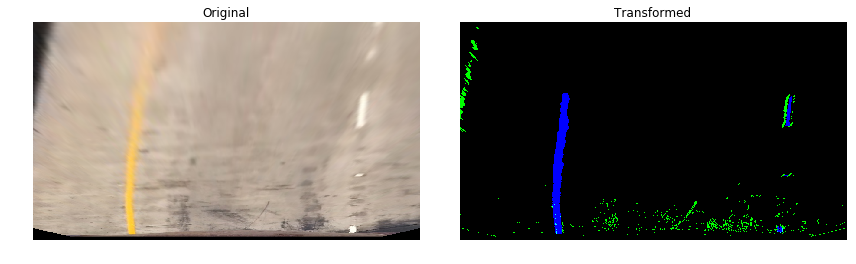

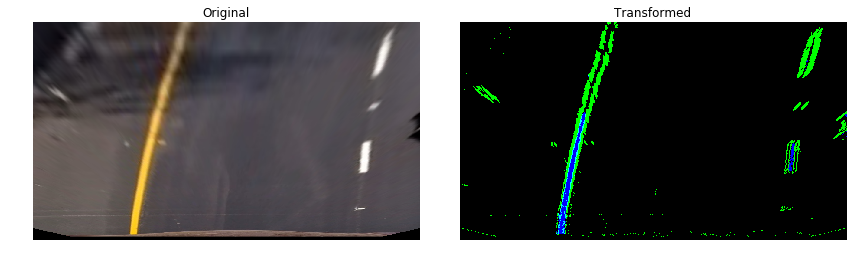

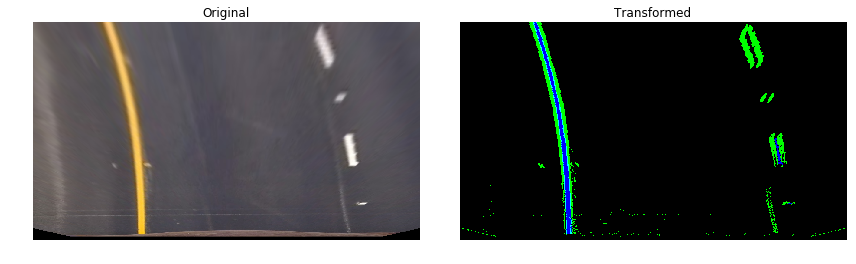

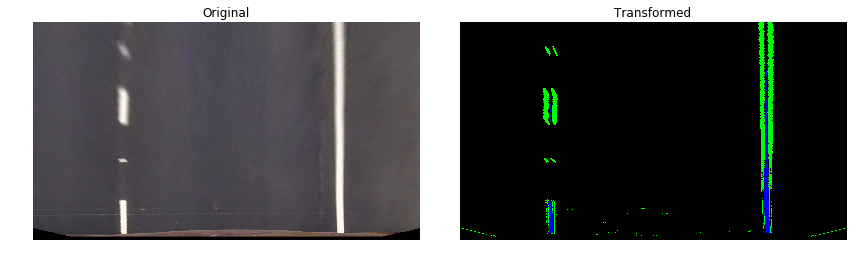

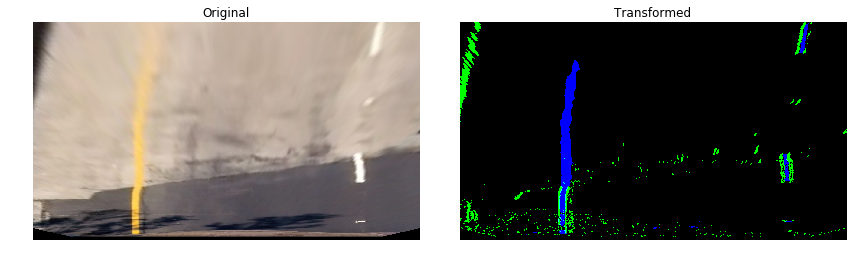

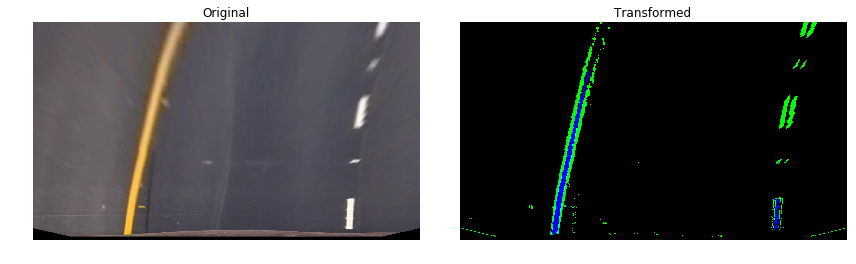

In [27]:
print_figures = {}
count = 0
for i in range(len(undistorted_figures)):
    color_binary = pipeline(undistorted_figures[i])
    print_figures[count] = undistorted_figures[i]
    print_figures[count+1] = color_binary
    plot_figures(print_figures, 1, 2, labels=["Original", "Transformed"])
    count = 0

## Summary 1: from the above testing results, one can tell, the combiming multiple thresholds from the sobel and color channel, working very good, and the next step is to use the histgram to further check whether the peak of the hisgram is easy to detect lanes or not.

### Testing the combine function with the histgram plot to see wether the two lanes show a obvious two peaks in hisgrams. 
*Spoil alert, they do*

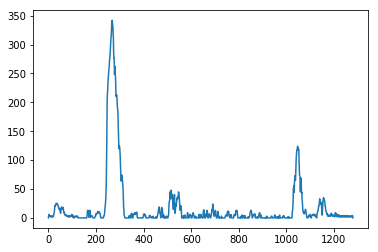

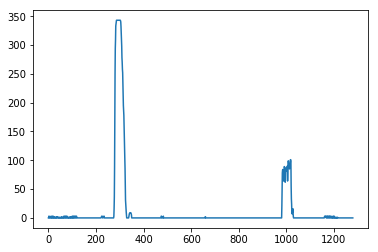

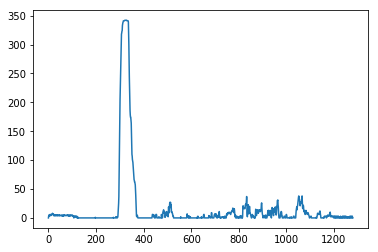

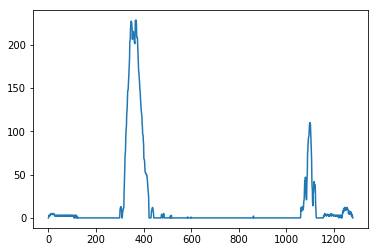

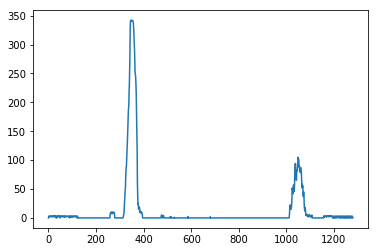

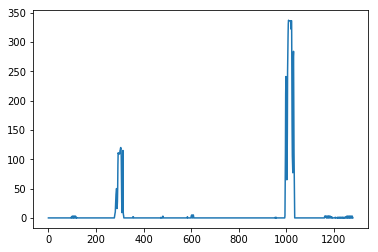

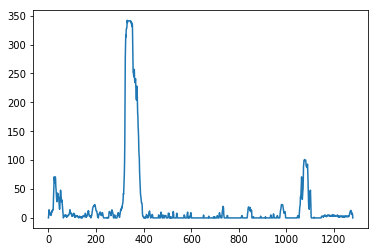

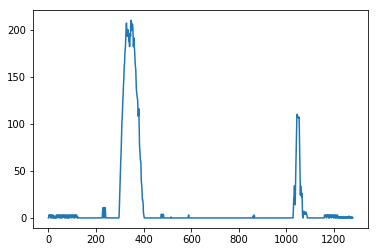

In [28]:
for i in range(len(undistorted_figures)):
    combined = combine(undistorted_figures[i])
    combined_name = './output_images/graph' + str(i + 1) + '.jpg'
    cv2.imwrite(combined_name, combined)    

    img = np.copy(combined)
    shape_by_two = int(img.shape[0]/2)
    histogram = np.sum(img[shape_by_two:,:], axis=0)
    plt.figure()
    plt.plot(histogram)

## Summary 2: the histograms indeed showed two obvious peak respesenting two lanes. 

### Next using the window function to find the lane windows

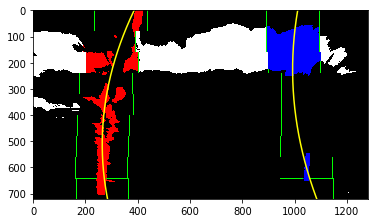

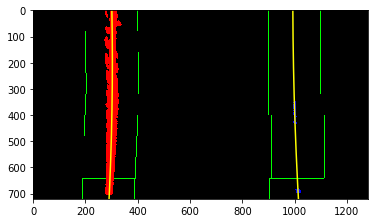

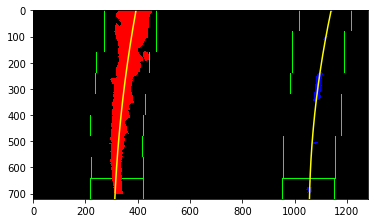

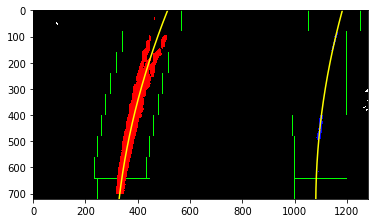

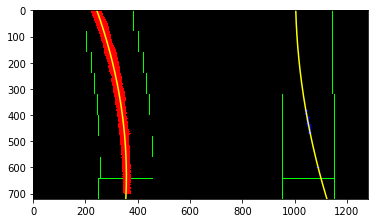

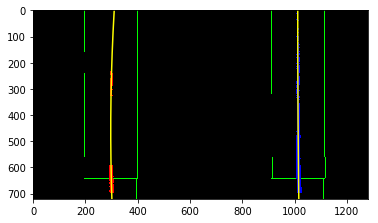

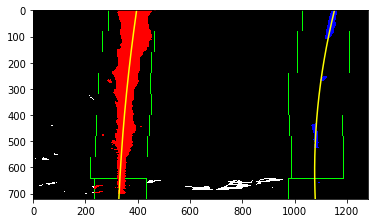

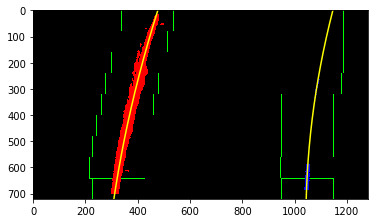

In [29]:
for i in range(len(undistorted_figures)):
    binary_warped = hls_select(undistorted_figures[i], thresh=(90, 255))

    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2)
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2)
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )

    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    combined_name = './output_images/windows' + str(i + 1) + '.jpg'
    cv2.imwrite(combined_name, out_img)

    plt.figure()
    plt.imshow(out_img)

    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)

## Put everything together

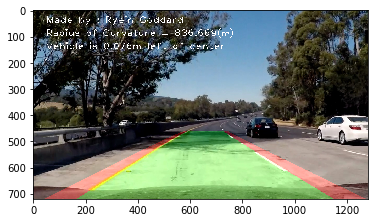

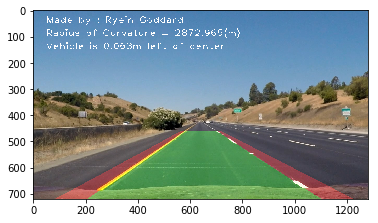

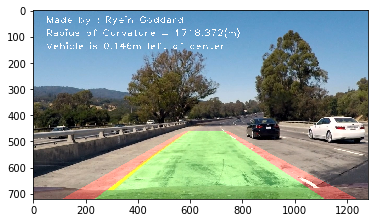

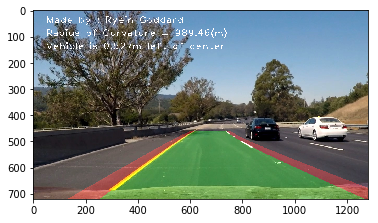

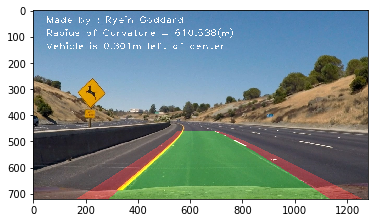

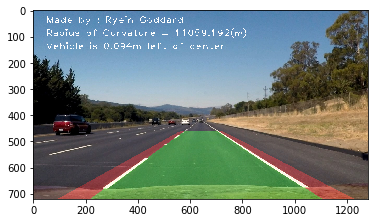

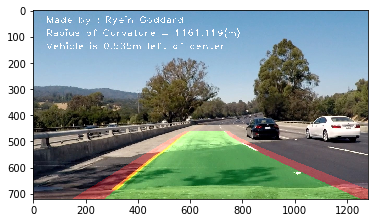

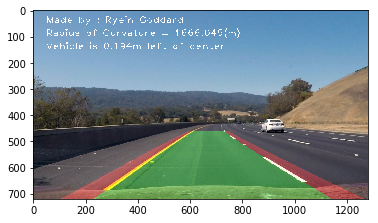

In [30]:
for i in range(len(undistorted_figures)):
    binary_warped = combine(undistorted_figures[i])

    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2)
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2)
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )

    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]    

    warped = binary_warped

    nonzero = warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) &
                      (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) &
                       (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
#     print(ploty.shape)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
#     print(left_fitx.shape)
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (255,0, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (255,0, 0))

    result = cv2.addWeighted(undistorted_figures[i], 1, window_img, 0.3, 0)

#     plt.figure()
#     plt.imshow(result)
#     plt.plot(left_fitx, ploty, color='yellow')
#     plt.plot(right_fitx, ploty, color='yellow')
#     plt.xlim(0, 1280)
#     plt.ylim(720, 0)

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    cv2.fillPoly(color_warp, np.int_([left_line_pts]), (255,0, 0))
    cv2.fillPoly(color_warp, np.int_([right_line_pts]), (255,0, 0))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (original_figures[i].shape[1], original_figures[i].shape[0]))

    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
#     print(left_curverad, right_curverad)

    # Combine the result with the original image
    result = cv2.addWeighted(original_figures[i], 1, newwarp, 0.3, 0)

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
#     print(left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m    

    # Calculate offset of car
    camera_center = (left_fitx[-1] + right_fitx[-1]) / 2
    center_diff = (camera_center - warped.shape[1] / 2) * xm_per_pix
    side_pos = 'left'
    if center_diff <= 0:
        side_pos = 'right'
    # Display radius of curvature and vehicle offset
    cv2.putText(result, 'Made by : Ryein Goddard ', (50, 50), cv2.FONT_HERSHEY_PLAIN, 2.5,
                (255, 255, 255), 2)
    # Display radius of curvature and vehicle offset
    cv2.putText(result, 'Radius of Curvature = ' + str(round(left_curverad, 3)) + '(m)', (50, 100), cv2.FONT_HERSHEY_PLAIN, 2.5,
                (255, 255, 255), 2)
    cv2.putText(result, 'Vehicle is ' + str(abs(round(center_diff, 3))) + 'm ' + side_pos + ' of center', (50, 150), cv2.FONT_HERSHEY_PLAIN,
                2.5, (255, 255, 255), 2)    

    combined_name = './output_images/plotted' + str(i + 1) + '.jpg'
    cv2.imwrite(combined_name, result)

    plt.figure()
    plt.imshow(result)

## Summary 3: it looks pretty good, let's try it on the video. 

## New pipeline for videos

In [31]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = []
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None
        #distance in meters of vehicle center from the line
        self.line_base_pos = None
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float')
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None

# for i in range(len(undistorted_figures)):
def process(image):
    img = undistort(image)
    img_size = (img.shape[1], img.shape[0])
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    warped = cv2.cvtColor(warped, cv2.COLOR_BGR2RGB)

    binary_warped = combine(warped)

    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    margin = 100

    global left_fit, right_fit, left_poly_list, right_poly_list
    if (left_fit, right_fit) == (None,None):
        # Assuming you have created a warped binary image called "binary_warped"
        # Take a histogram of the bottom half of the image
        histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
        # Create an output image to draw on and  visualize the result
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]/nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base
        # Set the width of the windows +/- margin
        margin = 100
        # Set minimum number of pixels found to recenter window
        minpix = 50
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2)
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2)
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds]
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]

        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        #save frame data for future
        left_poly_list = np.array([left_fit])
        right_poly_list = np.array([right_fit])
    else:
        left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) &
                          (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin)))
        right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) &
                           (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds]
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]

        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)

#     left_poly_list = np.array([left_fit])
#     right_poly_list = np.array([right_fit])

    #Average poly coefficient up to the last 10 frames
    left_poly_list = np.concatenate((left_poly_list,[left_fit]),axis=0)[-5:]
    right_poly_list = np.concatenate((right_poly_list,[right_fit]),axis=0)[-5:]
    left_fit = np.average(left_poly_list,axis=0)
    right_fit = np.average(right_poly_list,axis=0)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )

    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    warped = binary_warped    

    out_img = np.dstack((warped, warped, warped))*255
    out_img[lefty, leftx] = [255,0,0]
    out_img[righty,rightx] = [0,0,255]
#     nonzero = warped.nonzero()
#     nonzeroy = np.array(nonzero[0])
#     nonzerox = np.array(nonzero[1])

#     left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) &
#                       (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin)))
#     right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) &
#                        (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
#     leftx = nonzerox[left_lane_inds]
#     lefty = nonzeroy[left_lane_inds]
#     rightx = nonzerox[right_lane_inds]
#     righty = nonzeroy[right_lane_inds]

#     left_fit = np.polyfit(lefty, leftx, 2)
#     right_fit = np.polyfit(righty, rightx, 2)

#     # Generate x and y values for plotting
#     ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
# #     print(ploty.shape)
#     left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
# #     print(left_fitx.shape)
#     right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Create an image to draw on and an image to show the selection window

    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
#     out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
#     out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
#     out_img[lefty, leftx] = [255,0,0]
#     out_img[righty,rightx] = [0,0,255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (255,0, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (255,0, 0))

    result = cv2.addWeighted(image, 1, window_img, 0.3, 0)

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    cv2.fillPoly(color_warp, np.int_([left_line_pts]), (255,0, 0))
    cv2.fillPoly(color_warp, np.int_([right_line_pts]), (255,0, 0))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0]))

    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
#     print(left_curverad, right_curverad)

    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
#     print(left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m    

    # Calculate offset of car
    camera_center = (left_fitx[-1] + right_fitx[-1]) / 2
    center_diff = (camera_center - warped.shape[1] / 2) * xm_per_pix
    side_pos = 'left'
    if center_diff <= 0:
        side_pos = 'right'
    cv2.putText(result, 'Made by : Ryein Goddard ', (50, 50), cv2.FONT_HERSHEY_PLAIN, 2.5,
                (255, 255, 255), 2)
    # Display radius of curvature and vehicle offset
    cv2.putText(result, 'Radius of Curvature = ' + str(round(left_curverad, 3)) + '(m)', (50, 100), cv2.FONT_HERSHEY_PLAIN, 2.5,
                (255, 255, 255), 2)
    cv2.putText(result, 'Vehicle is ' + str(abs(round(center_diff, 3))) + 'm ' + side_pos + ' of center', (50, 150), cv2.FONT_HERSHEY_PLAIN,
                2.5, (255, 255, 255), 2)    

    return result

In [32]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
project_output = 'project_vid.mp4'
clip1 = VideoFileClip('project_video.mp4')
left_fit, right_fit = None, None
project_clip = clip1.fl_image(process)
%time project_clip.write_videofile(project_output, audio=False)

TypeError: undistort() missing 2 required positional arguments: 'mtx' and 'dist'